# Проектная работа
# Рынок заведений общественного питания Москвы

<div style="text-align: justify; border: 2px solid black; padding: 10px;">

<b> Описание проекта </b>

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания  в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
    
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
 
    
<b> Описание данных </b>

Файл *moscow_places.csv*:

* name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 
 *«Средний счёт: 1000–1500 ₽»;*
 
 *«Цена чашки капучино: 130–220 ₽»;*
 
 *«Цена бокала пива: 400–600 ₽».*
 
 *и так далее;*
 
 
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.


<b> Ход исследования </b>


- Изучение общей информации
- Предобработка данных
- Анализ данных
- Детализируем исследование: открытие кофейни
- Подготовка презентации
</div>

# Шаг 1. Изучение общей информации




In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
%matplotlib inline
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from pandas.plotting import register_matplotlib_converters
import warnings

import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as offline

fig = go.Figure(data=[go.Bar(y=[2, 3, 1])])
offline.plot(fig, filename='my_plot.html')

import json
import requests
from folium import Map, Choropleth, Marker, Icon
from folium.plugins import MarkerCluster
import folium
from plotly.subplots import make_subplots
from folium import Map, Choropleth
from branca.colormap import LinearColormap
from folium import plugins



In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [3]:
print('Количество заведений:', df['name'].nunique())

Количество заведений: 5614


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**Комментарий:**

Всего представлено 5614 уникальных заведений. На первый взгяд много пропусков. Можно посчитать долю пустых значений этих столбцов для наглядности. Есть довольно высокая оценка среднего чека - 35000, также максимальное колиество посадочных мест - 1288 (это очень много). Тип столбца `seats` 64-битное число с плавающей запятой, что некорректно.

# Шаг 2. Предобработка данных

In [6]:
df.groupby('seats')['name'].max()

seats
0.0           Японская кухня
1.0                   Шаурма
2.0        Японские традиции
3.0              Юнус Халяль
4.0              Шаурму Х@чу
                 ...        
760.0                    Дом
920.0         Стейк & Бургер
1040.0           Шоколадница
1200.0    РестоБар Argomento
1288.0        Японская кухня
Name: name, Length: 229, dtype: object

Огромное количество посадочных мест в заведении 'японская кухня'. Непохоже на название, возможно стоит удалить такие места, чтобы не исказить данные выбросами.

In [7]:
df.groupby('name')['seats'].count().sort_values(ascending=False)

name
Шоколадница          83
Кафе                 74
Додо Пицца           62
Домино'с Пицца       61
One Price Coffee     52
                     ..
Маренго               0
Royal hookah          0
Romashoff             0
Roma Pizza Coffee     0
#КешбэкКафе           0
Name: seats, Length: 5614, dtype: int64

In [8]:
df['seats'].max()

1288.0

In [9]:
df.loc[df['seats'] > 500, 'seats'].count()

56

In [10]:
df.groupby(by='category', as_index=False).agg(
    min=('seats', 'min'),
    max=('seats', 'max'),
    mean=('seats', 'mean'),
    median=('seats', 'median'))

,category,min,max,mean,median
0,"бар,паб",0.0,1288.0,124.532051,82.5
1,булочная,0.0,625.0,89.385135,50.0
2,быстрое питание,0.0,1040.0,98.891117,65.0
3,кафе,0.0,1288.0,97.512315,60.0
4,кофейня,0.0,1288.0,111.199734,80.0
5,пиццерия,0.0,1288.0,94.496487,55.0
6,ресторан,0.0,1288.0,121.944094,86.0
7,столовая,0.0,1200.0,99.750000,75.5


In [11]:
def seats_category(seats):
    if (seats != seats):
        return np.nan
    seats = int(seats)
    if (seats == 0):
        return '0'
    elif (seats <= 25):
        return 'Очень малые (1 - 25)'
    elif (seats <= 50):
        return 'Малые (26 - 50)'
    elif (seats <= 100):
        return 'Средние (51 - 100)'
    elif (seats <= 250):
        return 'Крупные (101 - 250)'
    elif (seats <= 500):
        return 'Очень крупные (251 - 500)'
    else:
        return 'Аномальные (501 +)'
    
df['seats_category']  = df['seats'].apply(seats_category)


In [12]:
category_and_seats=df.groupby(['category', 'seats_category'], as_index=False).agg(count=('category', 'count')).sort_values('count', ascending=False)


In [13]:
fig = px.bar(
    category_and_seats,
    x='category',
    y='count',
    title='Распределение заведений по категориям посадочных мест',
    color='seats_category')

fig.update_layout(
    xaxis_title='Категория заведения',
    yaxis_title='Количество заведений',
    xaxis_tickangle=-45,
    xaxis={'categoryorder':'total descending'}
)
fig.show()

Комментарий:
- Во многих категориях доминируют средние заведения (51 - 100 посадочных мест).
- Среди ресторанов распространены крупные заведения (101-250).
- Также распространены малые заведения в категории кафе (26-50).


In [14]:
print('Дубликатов:', df.duplicated().sum())


Дубликатов: 0


Явных дубликатов нет, посмотрим неявные. Наверняка заведений с одинаковым названием, улицей и районом нет.

In [15]:
df['name'] = df['name'].str.lower()

In [16]:
df[df.duplicated(subset = ['name', 'address', 'district'], keep=False)]


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,seats_category
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,Крупные (101 - 250)
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Крупные (101 - 250)
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,Крупные (101 - 250)
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,Крупные (101 - 250)
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,Очень крупные (251 - 500)
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,Очень крупные (251 - 500)


3 совпадения, удалим их.

In [17]:
df.drop_duplicates(subset=['name', 'address', 'district'], keep='first', inplace=True)
df.duplicated(subset = ['name', 'address', 'district']).sum()

0

In [18]:
df['name'].to_list()

['wowфли',
 'четыре комнаты',
 'хазри',
 'dormouse coffee shop',
 'иль марко',
 'sergio pizza',
 'огни города',
 'mr. уголёк',
 'donna maria',
 'готика',
 'great room bar',
 'шашлык шефф',
 'заправка',
 'буханка',
 'у сильвы',
 'дом обеда',
 'база стритфуд',
 'чайхана беш-бармак',
 'час-пик',
 'пекарня',
 'чебуреки манты',
 '7/12',
 'крымские чебуреки',
 'буханка',
 'drive café',
 'в парке вкуснее',
 'пикочино',
 'шаурму х@чу',
 'mafe',
 'кушай город',
 'кафедра',
 'алталия',
 'додо пицца',
 'изба',
 "домино'с пицца",
 'виладж пицца',
 'пекарня № 1 грузинская кухня',
 'халяль закусочная',
 'ижора',
 'шаурмагия',
 'кафе',
 'крошка картошка',
 'варня кафе',
 'суши & пицца',
 'кафетерий',
 '9 bar coffee',
 'cofefest',
 'кафе',
 'блинбери',
 '2u-ту-ю',
 'шаурма',
 'арамье',
 'cofix',
 'royal coffee',
 'шашлык',
 'чебуреки и манты',
 'рыба из тандыра',
 'мир пиццы',
 "coffeekaldi's",
 'хинкали gали!',
 'чебуречная история',
 'кафе лоза',
 'пить есть!',
 'pizza hut',
 'testo мания',
 'альбат

In [19]:
df.isna().sum()


name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
seats_category       3611
dtype: int64

In [20]:
pd.DataFrame(round(df.isna().mean()*100,)).style.background_gradient('coolwarm')



,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Много пропусков с столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`. Пропуски в данном случае нельзя удалить, так как это может исказить данные.

In [21]:
#создаем столбец street с названиями улиц  из столбцв с адресом

def extract_street(text):
    return text.split(',')[1]

df['street'] = df['address'].apply(extract_street)
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,seats_category,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Очень малые (1 - 25),улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Малые (26 - 50),Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Крупные (101 - 250),Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Средние (51 - 100),Профсоюзная улица
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Крупные (101 - 250),Пролетарский проспект
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Крупные (101 - 250),Люблинская улица
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Крупные (101 - 250),Люблинская улица


In [22]:
#создаем столбец is_24_7 для круглосуточных заведений

df['is_24_7'] = df['hours'] == 'ежедневно, круглосуточно'
df['is_24_7'].value_counts()


False    7673
True      730
Name: is_24_7, dtype: int64

In [23]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,seats_category,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Очень малые (1 - 25),улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Малые (26 - 50),Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Крупные (101 - 250),Правобережная улица,False


Посмотрим на названия дубликатов, которые не являются сетевыми. 

In [24]:
df[(df['name'].duplicated()) & (df['chain'] == 0)]['name'].unique()

array(['кафе', 'шаурма', 'ресторан', 'столовая', 'кафе-столовая',
       'мск lounge', 'франклинс бургер', 'буфет', 'кофейня', 'бистро',
       'новая столовая', 'важная персона', 'шаурма в пите', 'ля фантази',
       'гастроферма', 'халва, сеть почтоматов', "домино'с пицца",
       'korean chick', 'one&double', 'кофе стоп', 'шашлычная',
       'pomodoro royal', 'пиццерия', 'здоровое питание', 'гриль хаус',
       'carrots and beans', 'vabene', 'raw to go', 'istanbul kebab',
       'шашлык хаус', 'ku: рамен изакая бар', 'hellopapaya',
       'nova bubble tea', 'советские времена', 'хинкали point',
       'старый город', 'il pizzaiolo', 'блины', 'pinzeria by bontempi',
       'трапезная', 'рамен-клаб', 'хлеб насущный экспресс', 'на углях',
       'папан', 'поминальные обеды', 'ням-ням', 'кофеin',
       'pasta cup & pizza', 'домик в саду', 'wave california poke',
       'кафе для поминок', 'новатор кофе', 'one price coffee', 'han cook',
       'авлабар', 'bb grill', 'noba coffee', 'чудо

Заведения с названиями `столовая`, `ресторан`и прочие, которые не являются сетевыми, стоит удалить из таблицы. Они могут исказить данные, особенно для выявления топ-15.

In [25]:
remove_from_df = [
        'кафе', 'шаурма', 'ресторан', 'столовая', 'кафе-столовая', 'буфет',
        'кофейня', 'бистро', 'шашлычная', 'пиццерия', 'блины', 'трапезная', 
        'поминальные обеды', 'кафе для поминок', 'чебуречная', 'кафе-кулинария',
        'кафе шашлык'
]

In [26]:
df = df[~df['name'].isin(remove_from_df)].copy()
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,seats_category,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,Очень малые (1 - 25),улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Малые (26 - 50),Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Крупные (101 - 250),Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Средние (51 - 100),Профсоюзная улица,False
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Крупные (101 - 250),Пролетарский проспект,False
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Крупные (101 - 250),Люблинская улица,True
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Крупные (101 - 250),Люблинская улица,True


# Шаг 3. Анализ данных


**Категории заведений**

Посмотрим, какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям.
Построим визуализации.

In [27]:
df.groupby('name') \
    .agg(count=('name', 'count')) \
    .sort_values(by='count', ascending=False) \
    .reset_index() \
    .head(10) \
    .style.background_gradient('coolwarm')

,name,count
0,шоколадница,120
1,домино'с пицца,77
2,додо пицца,74
3,one price coffee,72
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [28]:
df.query('(name == "кафе" or name == "ресторан" or name == "столовая") and chain == 1')


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,seats_category,street,is_24_7


In [29]:
categories = df.groupby('category')['name'].count().reset_index(name='count').sort_values(by='count', ascending=True)
categories

,category,count
1,булочная,253
7,столовая,274
2,быстрое питание,558
5,пиццерия,629
0,"бар,паб",760
4,кофейня,1398
6,ресторан,1998
3,кафе,2164


In [30]:
categories['count'].sum()

8034

In [31]:

fig = px.bar(categories, 
             x = 'count', 
             y='category',
             title='Распределение заведений по категориям',
             template='plotly_white')

fig.update_layout(xaxis_title='Количество',
                  yaxis_title='Категория')
fig.show()

**Комметарий:**

Всего 8 категорий. 
Топ-3: 
- Наиболее популярна категория `кафе`: 2376 заведений. 
- На втором месте `рестораны` - 2042. 
- `Кофейня` на третьем - 1413.

Первые три категории составляют 69% от общего числа заведений.

Наименее популярная категория - `cтоловые` и `булочные`. Они составляют 6% от общего числа заведений.

`Кафе` и `ресторан` являются местом для долгих посиделок, деловых и дружеских встреч, семейных праздников. Они рассчитаны на широкую аудиторию с разнообразным меню и кухней. Могут располагаться почти везде: рядом с деловыми центрами, городскими парками, в спальном районе. Особой популярностью пользуются бизнес-ланчи и завтраки в кафе. 

`Кофейни` сегодня пользуются довольно хорошим спросом в связи с ритмом жизни людей. Сюда заходят ненадолго и чаще всего берут на вынос. Подходят для недолгих встреч, быстрых обедов с кофе, но меню содержит ограниченное количество блюд - в основном, это выпечка и десерты.

`Бары` (764) пользуются спросом у молодежи и людей средних лет. Актуально для встреч коллег после рабочего дня, для встречи с друзьями.  

`Пиццерия` (633) обладает ограниченным ассортиментом и работает на доставку. 

`Быстрое питание` (603) обычно находятся в торговых центрах, бизнес-центрах, где люди питаются между делами.

`Столовые` (315) обычно располагаются рядом с университетами, школами, государственными учреждениями, где есть большой поток людей. 

`Булочные` (256) на на последнем месте(256 заведений). Подходит для быстрого перекуса или покупкой выпечки после рабочего дня.

**Количество посадочных мест по категориям**

In [32]:
# возьмем медианное количество посадочных мест 

seats_category = df.groupby('category')['seats'].median().reset_index(name='count').sort_values(by='count', ascending=False)
seats_category

,category,count
6,ресторан,86.0
0,"бар,паб",83.0
4,кофейня,80.0
7,столовая,80.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


In [33]:
fig = px.bar(seats_category,
             x='category',
             y='count',
             title='Количество посадочных мест по категориям',
             template='plotly_white',
             color='category'

)

fig.update_layout(
    yaxis_title='Количество посадочных мест',
    xaxis_title='Категория заведения',
    xaxis_tickangle=-45,
    showlegend=False  
    )
  
fig.show()

    


- Больших отличий нет, особенно среди `ресторанов`, `баров` и `кофеен`.
- Рестораны могут иметь большую площадь для удобства гостей, так же, как и посадочных мест. 
- Наименьшее количество посадочных мест в булочной и пиццерии, что логично. Булочная предполагают заказ на вынос, а пиццерия доставку.

**Соотношение сетевых и несетевых заведений**

In [34]:
chain_counts = df['chain'].value_counts()
chain_counts

0    4833
1    3201
Name: chain, dtype: int64

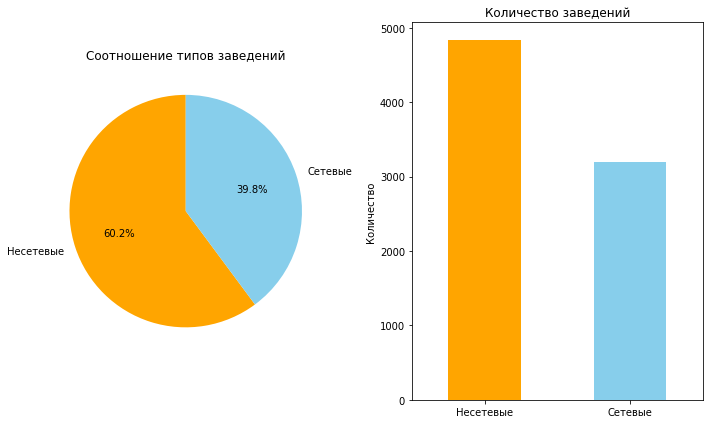

In [35]:
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.pie(chain_counts, 
        labels=['Несетевые', 'Сетевые'], 
        autopct='%1.1f%%',
        colors=['orange','skyblue'],
        startangle=90)
plt.title('Соотношение типов заведений')

plt.subplot(1, 2, 2)
chain_counts.plot(kind='bar', color=['orange','skyblue'])
plt.xticks([0, 1], ['Несетевые', 'Сетевые'], rotation=0)
plt.title('Количество заведений')
plt.ylabel('Количество')

plt.tight_layout()
plt.show()

- Несетевых заведений больше - 5199 заведений, а сетевых 3203. 


**Какие категории заведений чаще являются сетевыми?**

In [36]:
# Создаем перекрестную таблицу
chain_category = pd.crosstab(df['category'], df['chain'])
chain_category.columns = ['Несетевое', 'Сетевое']
chain_category

,Несетевое,Сетевое
category,,
"бар,паб",592,168
булочная,96,157
быстрое питание,326,232
кафе,1386,778
кофейня,678,720
пиццерия,299,330
ресторан,1269,729
столовая,187,87


In [37]:
chain_melted  = chain_category.reset_index().melt(
    id_vars='category', 
    value_vars=['Несетевое', 'Сетевое'],
    var_name='Тип заведения',
    value_name='Количество'
)
chain_melted

,category,Тип заведения,Количество
0,"бар,паб",Несетевое,592
1,булочная,Несетевое,96
2,быстрое питание,Несетевое,326
3,кафе,Несетевое,1386
4,кофейня,Несетевое,678
5,пиццерия,Несетевое,299
6,ресторан,Несетевое,1269
7,столовая,Несетевое,187
8,"бар,паб",Сетевое,168
9,булочная,Сетевое,157


In [38]:
total_counts = chain_melted.groupby('category')['Количество'].transform('sum')
chain_melted['Процент'] = chain_melted['Количество'] / total_counts * 100
chain_melted

,category,Тип заведения,Количество,Процент
0,"бар,паб",Несетевое,592,77.894737
1,булочная,Несетевое,96,37.944664
2,быстрое питание,Несетевое,326,58.422939
3,кафе,Несетевое,1386,64.048059
4,кофейня,Несетевое,678,48.497854
5,пиццерия,Несетевое,299,47.535771
6,ресторан,Несетевое,1269,63.513514
7,столовая,Несетевое,187,68.248175
8,"бар,паб",Сетевое,168,22.105263
9,булочная,Сетевое,157,62.055336


In [39]:
fig = px.bar(
    chain_melted,
    x='category',
    y='Количество',
    color='Тип заведения',
    title='Распределение сетевых и несетевых заведений по категориям',
    labels={'category': 'Категория заведения'},
    template='plotly_white',
    text=chain_melted['Процент'].apply(lambda x: f'{x:.1f}%'))

fig.update_layout(
    xaxis_tickangle=-45,
    xaxis={'categoryorder':'total descending'}
)



fig.show()

- В категориях `кофейня` (51%), `пиццерия` (52.1%) и `булочная` (61.3%) сетевых заведений чуть больше, чем несетевых, что отличает эти категории от остальных. Возможно, причинами этого являются готовый бизнес с минимальными вложениями, довольно простая организация и управление по сравнению с другими категориями (кофе, готовая выпечка, единый рецепт пиццы). Также люди, возможно, люди охотнее идут в сетевые заведения данной категории из-за доверия к компании.
- Наибольший процент несетевых заведений - в категории `бар, паб`(78%), так же `столовая`(72.1%), что вполне обоснованно, так как бары чаще всего имеют свой уникальный стиль и неповторимую атмосферу, чтобы повышать лояльность, степень комфорта посетителей. А столовые ориентируются на локальный опыт и быстрое питание, однако столовые тоже должны выделяться среди остальных и иметь свою изюминку.

**Топ-15 популярных сетей в Москве**

In [40]:
top_15 = (
    df[df['chain'] == 1]
    ['name']
    .value_counts()
    .head(15)
    .reset_index()
)
top_15.columns = ['name', 'count']
top_15


,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [41]:
fig = px.bar(
    top_15, 
    x='name', 
    y='count', 
    title='Топ-15 популярных сетей в Москве',
    labels={'name':'Название заведения', 'count':'Количество'},
    template='plotly_white',
    color='name'

)
    
fig.update_layout(
    yaxis_title='Количество заведений в сети',
    xaxis_title='Название сети',
    xaxis_tickangle=-45,
    showlegend=False

)


fig.show()

- Сеть `Шоколадница` составляет 14% от количества всех сетей из топ-15 (120).
- Топ-15 сетей Москвы занимают почти 10% от всех заведений города. 


**Общий признак**, который объединяет эти сети - шаговая доступность от общественного транспорта (метро, автобусы) и расположение в районе с большим потоком людей. Также стоит отметить предельный уровень среднего чека, что благоприятно влияет на покупательную способность населения (предсказуемость цен при посещении, что облегчает выбор для людей). Часто люди выбирают знакомые места в незнакомых местах.




In [42]:
df_chain = df[df['chain'] == 1]
top_15 = df_chain.groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,120
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,71
4,яндекс лавка,4.00,ресторан,69
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,кулинарная лавка братьев караваевых,4.40,кафе,39


In [43]:
top15_category = top_15.groupby('category')['count'].sum().reset_index()

fig = px.bar(
    top15_category,
    x='category',
    y='count',
    title='Распределение топ-15 сетей по типам заведений',
    labels={'category': 'Тип заведения', 'count': 'Количество объектов'},
    color='category',  
    template='plotly_white'
)

fig.update_layout(
    xaxis_tickangle=-45, 
    yaxis_title='Количество заведений',
    showlegend=False,
    xaxis={'categoryorder': 'total descending'}
     
)

fig.show()

Комментарий:
- Категория `кофейня` - самый популярный тип заведения из Топ-15 (`330` кофеен)
- `Ресторан`, `пиццерия`, `кафе` ненамного - `147-157` заведений.
- `Булочная` на последнем месте - `32`.

Кофейни популярны, потому что сочетают в себе функциональность (кофе + еда + работа). 
К тому же особая атмосфера, любовь к кофе и привычка создавать себе ритуал делают кофейни более востребованными в обществе.

**Административные районы Москвы**. Общее количество заведений и количество заведений каждой категории по районам. 

In [44]:
district_count = df['district'].value_counts().reset_index()
district_count.columns = ['district', 'total_count']

district_count

,district,total_count
0,Центральный административный округ,2213
1,Северный административный округ,856
2,Южный административный округ,854
3,Северо-Восточный административный округ,847
4,Западный административный округ,807
5,Восточный административный округ,741
6,Юго-Западный административный округ,676
7,Юго-Восточный административный округ,664
8,Северо-Западный административный округ,376


In [45]:
district_chain_df = df.groupby(['district', 'category']).agg({'rating' : 'median', 'name' : 'count'})
district_chain_df = district_chain_df.sort_values('rating', ascending = False).reset_index()
district_chain_df = district_chain_df.rename(columns={'name':'count'})
district_chain_df.head()

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.5,363
1,Западный административный округ,"бар,паб",4.5,50
2,Северо-Западный административный округ,"бар,паб",4.4,23
3,Центральный административный округ,ресторан,4.4,666
4,Центральный административный округ,пиццерия,4.4,111


In [46]:
fig = px.bar(district_chain_df,
             x='count',
             y='district',
             template='plotly_white',                    
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

- Больше всего заведений в ЦАО - их тут `2242`. 
- САО, ЮАО, СВАО примерно на одном уровне - `890-898`.
- ЗАО - `850`.
- ВАО, ЮЗАО, ЮВАО в диапазоне `709-798`.
- Низкой привлекательностью пользуется СЗВО, где заведений `409`.

В центральном административном округе сосредоточены офисы, туристические достопримечательности, бизнес-центры. Значит, там большая проходимость. Развитая инфраструктура так же играет ключевую роль: общественный транспорт, удобные пешеходные переходы, развлекательные объекты. Здесь высокая конкуренция, но разнообразие заведений только привлекает поток посетителей. Оплата аренды выше, но есть большая вероятность окупиться. 

**Распределение средних рейтингов по категориям заведений**

In [47]:
avg_rating_category = round(df.groupby('category')['rating'].mean().reset_index(), 2).sort_values(by='rating', ascending=False)
avg_rating_category

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.15
2,быстрое питание,4.06


In [48]:
fig = px.bar(
    avg_rating_category, 
    x='category', 
    y='rating', 
    color ='category',
    title='Средний рейтинг по категориям заведений',
    labels={'category':'Категория заведения', 'rating':'Рейтинг'},
    template='plotly_white'

)
    
fig.update_layout(
  
    xaxis_tickangle=-45,
    yaxis_range=[avg_rating_category['rating'].min() - 0.2, 
                 avg_rating_category['rating'].max() + 0.2], 
    showlegend = False
)


fig.show()

- Больших различий в рейтингах заведений нет.
- `Бары` имеют лучший средний рейтинг среди заведений Москвы (`4.39`). Возможно, развлекательные заведения оставляют чаще остальных оставляют хорошее впечатление. Напитки в барах создаются топовыми барменами, они обучаются в лучших школах. Высокий рейтинг - это результат комплексного подхода и создание уникального опыта.
- `Пиццерия` на втором месте. Причины могут быть разные, но, предположительно, про хорошую пиццерию люди должны знать, поэтому посетители чаще оставляют отзывы и ставят рейтинги. Пиццерия ориентируется на одном блюде, и важно, чтобы людям действительно нравилось и им хотелось заказать пиццу в проверенном месте на все случаи жизни за приемлемую стоимость.
- `Быстрое питание` имеет наименьший рейтинг из топа. Возможные причины: люди едят на ходу, покупают и разочаровываются. Может быть дело в качестве продуктов, проблемы с обслуживанием, антисанитария и пр.


**Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района**

In [49]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.19
1,Западный административный округ,4.19
2,Северный административный округ,4.25
3,Северо-Восточный административный округ,4.16
4,Северо-Западный административный округ,4.23
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.12
7,Юго-Западный административный округ,4.19
8,Южный административный округ,4.19


In [50]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10,  tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m


    В ЦАО за рейтинг самый высокий - 4.38.
   

Заведения датасета на карте


In [51]:
m = folium.Map([55.751244, 37.618423], zoom_start=8)
heatmap = df[['lat','lng']]
m.add_child(plugins.HeatMap(heatmap, radius=14))
m    
marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

По карте наглядно видно, что больше всего заведений в центре Москвы, т.е. в ЦАО.


   **Топ-15 улиц по количеству заведений** 


 
 

In [52]:
top_streets = df.groupby('street').agg(count=('name', 'count')).sort_values(
    'count', ascending=False).head(15).index.tolist()


In [53]:
street_cat = df[df['street'].isin(top_streets)].groupby(['street', 'category'], as_index=False).agg(
    count=('street', 'count')).sort_values('count', ascending=False)
street_cat

,street,category,count
92,проспект Мира,кафе,52
95,проспект Мира,ресторан,44
62,МКАД,кафе,36
93,проспект Мира,кофейня,35
87,проспект Вернадского,ресторан,33
...,...,...,...
88,проспект Вернадского,столовая,1
82,проспект Вернадского,булочная,1
58,Люблинская улица,пиццерия,1
65,МКАД,столовая,1


In [54]:
fig = px.bar(
    street_cat, 
    x='count', 
    y='street', 
    color ='category',
    title='Топ-15 улиц по количеству заведений и их категории',
    labels={'category':'Категория', 'count':'Количество заведений'},
    template='plotly_white'

)
    
fig.update_layout(
    xaxis_title='Количество заведений',
    yaxis_title='Название улиц',
    yaxis={'categoryorder':'total ascending'},
    xaxis_tickangle=-45

)


fig.show()

Комментарий:
- Больше всего заведений на `проспекте мира`. 
- Здесь преобладают `кафе`, `рестораны` и `кофейни`.
- На улицах `Профсоюзная`, `Ленинградский` и `проспекте Вернадского` больше 100 заведений. 
- По категориям преобладают те же типы заведений. 

`Проспект Мира` является одной из главных радиальных проспектов Москвы, здесь состредоточены исторические достопримечательноси, важные траспортные узлы, развитая инфраструктура, престижный уровень жизни. Соединяет ключевые районы: Центр, Алексеевский, Ростокино, ВДНХ, Останкино. Вполне логично, что проспект Мира на первом месте. 

Почти то же самое можно сказать и о других популярных улицах - это `крупные траспортные магистрали Москвы`. Эти улицы соединяют разные части города и влияют на логистику города и жизнь миллионов людей.


**Улицы, на которых находится только один объект общепита.** 

In [55]:
single_object = df['street'].value_counts().reset_index()
single_object.columns = ['street_name', 'cafe_count']
single_object = single_object[single_object['cafe_count'] == 1]
single_object


,street_name,cafe_count
957,парк Алтуфьево,1
958,№ 7,1
959,проспект Лихачёва,1
960,улица Габричевского,1
961,улица Вешних Вод,1
...,...,...
1407,Маленковская улица,1
1408,2-я Рощинская улица,1
1409,Симферопольский проезд,1
1410,улица Луиджи Лонго,1


In [56]:
single_objects = df[df['street'].isin(single_object['street_name'])]

district_category_counts = (single_objects
                          .groupby(['district', 'category'], as_index=False)
                          .size()
                          .rename(columns={0: 'count'}))
# Сортируем округа по общему количеству одиночных заведений
district_order = single_objects['district'].value_counts().index
district_category_counts['district'] = pd.Categorical(district_category_counts['district'], 
                                             categories=district_order, 
                                             ordered=True)


In [57]:
fig = px.bar(
    district_category_counts,
    x='size',
    y='district',
    color='category',
    title='Распределение одиночных заведений по округам и категориям',
    labels={'size': 'Количество заведений', 'district': 'Округ'},
    height=600,
    template='plotly_white'

)

fig.update_layout(
    xaxis_title='Количество заведений',
    yaxis_title='Округ',
    legend_title='Категория',
    yaxis={'categoryorder': 'total ascending'})


fig.show()

Комментарий:
- В ЦАО больше всего одиночных заведений. Чаще всего это `кафе`, `ресторан` и `кофейня`.
- В остальных округах лидирует `кафе`, кроме СЗАО.

В общем, ЦАО по количеству заведений лидирует, поэтому среди одиночных заведений стоит на первом месте.  

Возможные причины, почему на некоторых улицах Москвы может быть только по одному заведению:
- новые районы с застройками, которые еще не успели развиться;
- низкий трафик;
- юридические ограничения: сложности с получением развершения и т.д. и пр.

In [58]:
avg_bill = df.groupby('district', as_index=False).agg(
    avg_bill=('middle_avg_bill', 'mean'))
avg_bill['avg_bill'] = round(avg_bill['avg_bill'], 2)
avg_bill

,district,avg_bill
0,Восточный административный округ,830.33
1,Западный административный округ,1056.27
2,Северный административный округ,936.25
3,Северо-Восточный административный округ,719.57
4,Северо-Западный административный округ,822.69
5,Центральный административный округ,1192.72
6,Юго-Восточный административный округ,658.93
7,Юго-Западный административный округ,796.81
8,Южный административный округ,730.48


In [59]:

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианная стоимость среднего чека по районам',
).add_to(m)

m

- Ожидаемо медианная стоимость среднего чека выше в Центральном административном округе.
- Чуть ниже в Западном административном округе.
- Самая низкая стоимость в Южном административном округе.

Отдаленность от центра довольно сильно влияет на ценовой диапазон (примерно на 1.5-2 раза).


**Выводы:**
- Наиболее популярна категория `кафе`: 2376 заведений. На втором месте `рестораны` - 2042.  `Кофейня` на третьем - 1413.
- Рестораны, бары и кофейни имеет больше всего посадочных мест.
- Несетевых заведений больше - 5199 заведений, а сетевых 3203. 
- В категориях кофейня (51%), пиццерия (52.1%) и булочная (61.3%) сетевых заведений чуть больше, чем несетевых.
- Наибольший процент несетевых заведений - в категории бар, паб(78%), так же столовая(72.1%)
- Топ-15 сетей Москвы занимают почти 10% от всех заведений города.
- Больше всего заведений в ЦАО - их тут 2242.
- Бары имеют лучший средний рейтинг среди заведений Москвы (4.39)
- `Быстрое питание` имеет наименьший рейтинг из топа.
- Больше всего заведений на проспекте мира. Здесь преобладают кафе, рестораны и кофейни.
- `455` улиц, где только 1 заведение. Чаще всего это `кафе`.
- Медианная стоимость среднего чека выше в Центральном административном округе.


# Шаг 4. Детализируем исследование: открытие кофейни


- Сколько всего кофеен в датасете?
- В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

**Количество кофеен и их расположение**

In [60]:
coffee_count = df[df['category'] == 'кофейня']
print(f"Всего кофеен в датасете: {coffee_count.shape[0]}")


Всего кофеен в датасете: 1398


In [61]:
coffee_by_district = df[df['category'] == 'кофейня'].groupby('district', as_index=False) \
    .size() \
    .sort_values('size', ascending=False) 

print("Районы с наибольшим количеством кофеен:")
print(coffee_by_district.reset_index())


Районы с наибольшим количеством кофеен:
   index                                 district  size
0      5       Центральный административный округ   426
1      2          Северный административный округ   191
2      3  Северо-Восточный административный округ   156
3      1          Западный административный округ   147
4      8             Южный административный округ   129
5      0         Восточный административный округ   105
6      7      Юго-Западный административный округ    95
7      6     Юго-Восточный административный округ    88
8      4   Северо-Западный административный округ    61


In [62]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_count.apply(create_clusters, axis=1)

# выводим карту
m3


Комментарий:
В центре ожидаемо много кофеен, большая концентрация и максимальный трафик наблюдается в основном:
- рядом с транпортными узлами (метро, автобусные остановки, вокзалы);
- вблизи бизнес-центров
- в торговых центрах
- рядом с площадями, парками
- с достопримечательностями, историческими местами.

Набрали популярность в последние годы скрытые кофейни, которые располагаются во дворах, создавая особу атмосферу для посетителей. Возможно, стоит обратить внимание на такой формат.

Центр привлекателен высокой проходимость и особенностей потребительского поведения: большинство берут кофе на вынос или сидят в кофейнях, создавая себе место для работы. 

**Круглосуточные кофейни**

In [63]:
day_n_night = df.query('hours == "ежедневно, круглосуточно" and category == "кофейня"')

coffee_shops = day_n_night.groupby('district').agg(count=('name', 'count')).reset_index()

print(f'Количество круглосуточных кофеен: {coffee_shops["count"].sum()}')

Количество круглосуточных кофеен: 59


In [64]:
fig = px.bar(
    data_frame=coffee_shops.sort_values('count', ascending=False),
    x='count', y='district',
    title='Количество круглосуточных кофеен по районам',
    height=450
)

fig.update_layout(
    legend_title='Район',
    template='plotly_white',
    xaxis_title='Количество заведений',
    yaxis_title='Название района',
    xaxis_tickangle=-45,
    yaxis={'categoryorder':'total ascending'}
           )
fig.show()

Круглосуточных кофеен больше всего в ЦАО, но количество довольно мало - `26`.

In [65]:
cafe_rating_cost = df.groupby(by='district', as_index=False).agg(
    count=('rating', 'mean'), avg_cup=('middle_coffee_cup', 'mean'))
cafe_rating_cost['count'] = round(cafe_rating_cost['count'], 2)
cafe_rating_cost['avg_cup'] = round(cafe_rating_cost['avg_cup'])
cafe_rating_cost.sort_values('avg_cup', ascending=False)

,district,count,avg_cup
1,Западный административный округ,4.19,190.0
5,Центральный административный округ,4.38,188.0
7,Юго-Западный административный округ,4.19,183.0
0,Восточный административный округ,4.19,174.0
2,Северный административный округ,4.25,165.0
3,Северо-Восточный административный округ,4.16,165.0
4,Северо-Западный административный округ,4.23,160.0
8,Южный административный округ,4.19,158.0
6,Юго-Восточный административный округ,4.12,151.0


In [66]:
fig_rating = px.bar(
    cafe_rating_cost,
    x='count',
    y='district',
    title='Средний рейтинг кофеен по округам Москвы',
    labels={'count': 'Средний рейтинг', 'district': 'Округ'},
    color='count',
    color_continuous_scale='Blues',
    text='count'
)

fig_rating.update_layout(
    yaxis={'categoryorder': 'total ascending'},
    xaxis_range=[0, 5],  
    coloraxis_showscale=False
)
fig_rating.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig_rating.show()

- Центральный административный округ показывает наилучший рейтинг среди остальных. 
- Чуть ниже в Северо-Западном административном округе. 

Заведения вынуждены поддерживать высокие стандарты и тщательнее следят за отзывами. Посетители чаще оставляют отзывы в центре и ценовая политика выше, чем в других районах.
Также , возможно, в центре чаще проводятся проверки качества соответствующими органами. Комплексный подход заведений благоприятно влияют на рейтинги.

In [67]:
fig_price = px.bar(
    cafe_rating_cost,
    x='avg_cup',
    y='district',
    title='Средняя цена кофе по округам Москвы',
    labels={'avg_cup': 'Средняя цена (руб)', 'district': 'Округ'},
    color='avg_cup',
    color_continuous_scale='Reds',
    text='avg_cup'
)

fig_price.update_layout(
    yaxis={'categoryorder': 'total ascending'},
    coloraxis_showscale=False
)
fig_price.update_traces(texttemplate='%{text} руб', textposition='outside')
fig_price.show()

- В ЗАО чашка кофе стоит дороже, чем в ЦАО. 
- На втором месте ЦАО.
- Далее идет ЮЗАО.

Это возможный показатель перспективности Западной административной области. Конкуренция чуть ниже, чем в ЦАО, лояльная аренда, растущий спрос.

#  Выводы и рекомендации

- При открытии кофейни стоит ориентироваться на среднюю цену кофе по району. 
- Рекомендуемые районы: ЦАО, ЗАО и ЮЗАО. 
- В ЗАО самая высокая стоимость чашки капучино - `190` рублей. 
- Далее идут ЗАО `188` и ЮЗАО `183`.
- Спрос на кофе растет, судя по данным из https://wordstat.yandex.ru/. Развитие культуры кофе сказывается на запросы в поисковиках. 
- `Центральный административный округ` показывает наилучший рейтинг среди остальных.
- Чуть ниже в `Северо-Западном административном округе`. Кофейни тщательно следят за отзывами и рейтингами.
- Наблюдается дефицит круглосуточных кофеен, но они не предполагают ночной работы, поэтому вполне оправданно. 
- Кофейни составляют 16% от всех категорий, что довольно хороший показатель.
- 51% кофеен являются сетевыми, стоит исследовать сетевые заведения.
- В топ-15 целых 5 кофеен, на первом месте Шоколадница. 
- Перед открытием стоит учитывать плотность населения, покупательскую способность, перспективные строящиеся районы. 




https://docs.google.com/presentation/d/1N0feHP_dmexAiWYm3TCiyJs9Awpo2IUD3MFMIWXoGCs/edit?usp=sharing